In [2]:
import pickle
import csv
import matplotlib.pyplot as plt


In [64]:
import csv

# Initialize dictionaries
TAU1oodsvhn = {}
TAU2oodsvhn = {}
TAU3oodsvhn = {}

# Read data from the CSV file
with open('/home/local/ASUAD/asing651/ResnetCifar10pytorchFI/DRDNA/b10c32/testwitOODSVHNoutput.csv', 'r') as file:
    reader = csv.reader(file)
    
    for row_index, row in enumerate(reader):
        # Initialize dictionaries for each row
        TAU1oodsvhn[row_index] = {}
        TAU2oodsvhn[row_index] = {}
        TAU3oodsvhn[row_index] = {}
        
        # Process each tuple in the row
        for item in row:
            # Remove parentheses and split by commas
            item = item.strip("()").split(", ")
            layername = item[0].strip("'")
            tau1 = float(item[1])
            tau2 = float(item[2])
            tau3 = float(item[3])
            
            # Populate the dictionaries
            TAU1oodsvhn[row_index][layername] = tau1
            TAU2oodsvhn[row_index][layername] = tau2
            TAU3oodsvhn[row_index][layername] = tau3

In [3]:
import csv

# Initialize dictionaries
TAU1advPGD = {}
TAU2advPGD = {}
TAU3advPGD = {}

# Read data from the CSV file
with open('/home/local/ASUAD/asing651/ResnetCifar10pytorchFI/DRDNA/b10c32/testwitadvPGDoutput.csv', 'r') as file:
    reader = csv.reader(file)
    
    for row_index, row in enumerate(reader):
        # Initialize dictionaries for each row
        TAU1advPGD[row_index] = {}
        TAU2advPGD[row_index] = {}
        TAU3advPGD[row_index] = {}
        
        # Process each tuple in the row
        for item in row:
            # Remove parentheses and split by commas
            item = item.strip("()").split(", ")
            layername = item[0].strip("'")
            tau1 = float(item[1])
            tau2 = float(item[2])
            tau3 = float(item[3])
            
            # Populate the dictionaries
            TAU1advPGD[row_index][layername] = tau1
            TAU2advPGD[row_index][layername] = tau2
            TAU3advPGD[row_index][layername] = tau3

In [66]:
import csv

# Initialize dictionaries
TAU1adv = {}
TAU2adv = {}
TAU3adv = {}

# Read data from the CSV file
with open('/home/local/ASUAD/asing651/ResnetCifar10pytorchFI/DRDNA/b10c32/testwithadvfgsmoutput.csv', 'r') as file:
    reader = csv.reader(file)
    
    for row_index, row in enumerate(reader):
        # Initialize dictionaries for each row
        TAU1adv[row_index] = {}
        TAU2adv[row_index] = {}
        TAU3adv[row_index] = {}
        
        # Process each tuple in the row
        for item in row:
            # Remove parentheses and split by commas
            item = item.strip("()").split(", ")
            layername = item[0].strip("'")
            tau1 = float(item[1])
            tau2 = float(item[2])
            tau3 = float(item[3])
            
            # Populate the dictionaries
            TAU1adv[row_index][layername] = tau1
            TAU2adv[row_index][layername] = tau2
            TAU3adv[row_index][layername] = tau3

# Now TAU1, TAU2, and TAU3 have the required structure


In [4]:
import csv

# Initialize dictionaries
TAU1nosdc = {}
TAU2nosdc = {}
TAU3nosdc = {}

# Read data from the CSV file
with open('/home/local/ASUAD/asing651/ResnetCifar10pytorchFI/DRDNA/b10c32/testwithoutSDC.csv', 'r') as file:
    reader = csv.reader(file)
    
    for row_index, row in enumerate(reader):
        # Initialize dictionaries for each row
        TAU1nosdc[row_index] = {}
        TAU2nosdc[row_index] = {}
        TAU3nosdc[row_index] = {}
        
        # Process each tuple in the row
        for item in row:
            # Remove parentheses and split by commas
            item = item.strip("()").split(", ")
            layername = item[0].strip("'")
            tau1 = float(item[1])
            tau2 = float(item[2])
            tau3 = float(item[3])
            
            # Populate the dictionaries
            TAU1nosdc[row_index][layername] = tau1
            TAU2nosdc[row_index][layername] = tau2
            TAU3nosdc[row_index][layername] = tau3

# Now TAU1, TAU2, and TAU3 have the required structure

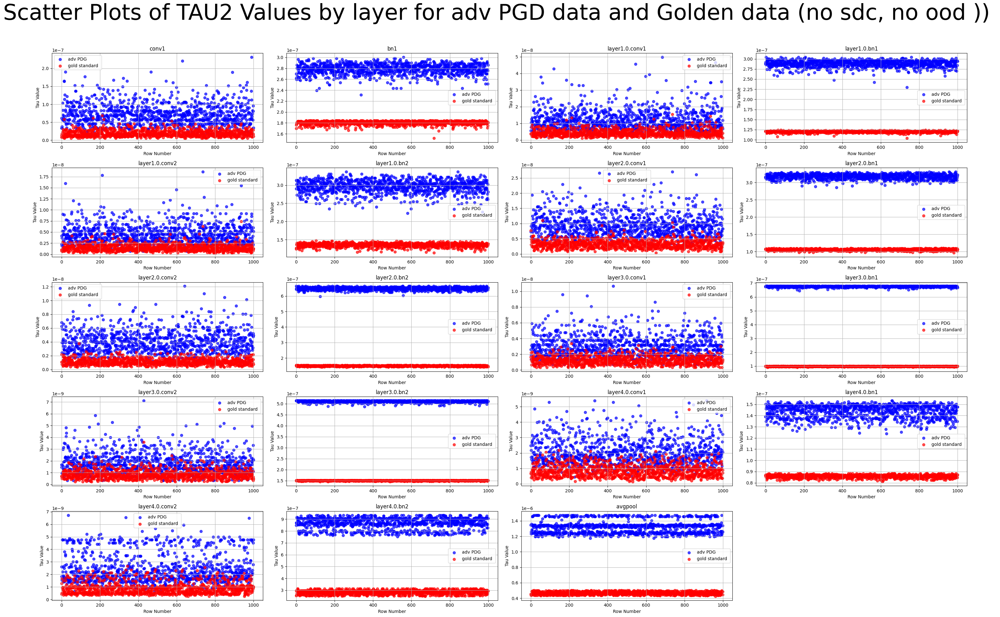

In [5]:
import matplotlib.pyplot as plt
import math

# Get unique layer names
layer_names = list(TAU2nosdc[0].keys())
num_layers = len(layer_names)

# Determine grid layout (e.g., 4x4 for 16 layers, adjust as necessary)
cols = 4
rows = math.ceil(num_layers / cols)

# Create subplots
fig, axes = plt.subplots(rows, cols, figsize=(30, 20))
fig.suptitle('Scatter Plots of TAU2 Values by layer for adv PGD data and Golden data (no sdc, no ood )) ', fontsize=50)

# Plot each layer in its own subplot
for idx, layer_name in enumerate(layer_names):
    # Calculate row and column index for subplot
    row_idx = idx // cols
    col_idx = idx % cols
    
    # data1 = [ TAU1adv[key][layer_name] for key in TAU1adv ]
    data2 = [ TAU2nosdc[key][layer_name] for key in TAU2nosdc ]
    data3 = [ TAU2advPGD[key][layer_name] for key in TAU2advPGD ]
    # data4 = [ TAU1oodsvhn[key][layer_name] for key in TAU1oodsvhn ]
    row_indices = list(range(1000))
    
    # Scatter plot for this layer
    ax = axes[row_idx, col_idx]
    ax.scatter(row_indices, data3[:1000], color='blue', label='adv PDG', alpha=0.7)
    ax.scatter(row_indices, data2[:1000], color='red', label='gold standard ', alpha=0.7)
    # ax.scatter(row_indices, data3[:1000], color='green', label='advPGd', alpha=0.7)
    # ax.scatter(row_indices, data4[:1000], color='black', label='oodsvhn', alpha=0.7)
    ax.set_title(layer_name)
    ax.set_xlabel('Row Number')
    ax.set_ylabel('Tau Value')
    ax.legend()
    ax.grid(True)

# Hide any empty subplots
for idx in range(num_layers, rows * cols):
    fig.delaxes(axes.flatten()[idx])

plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout to make room for the main title
plt.show()


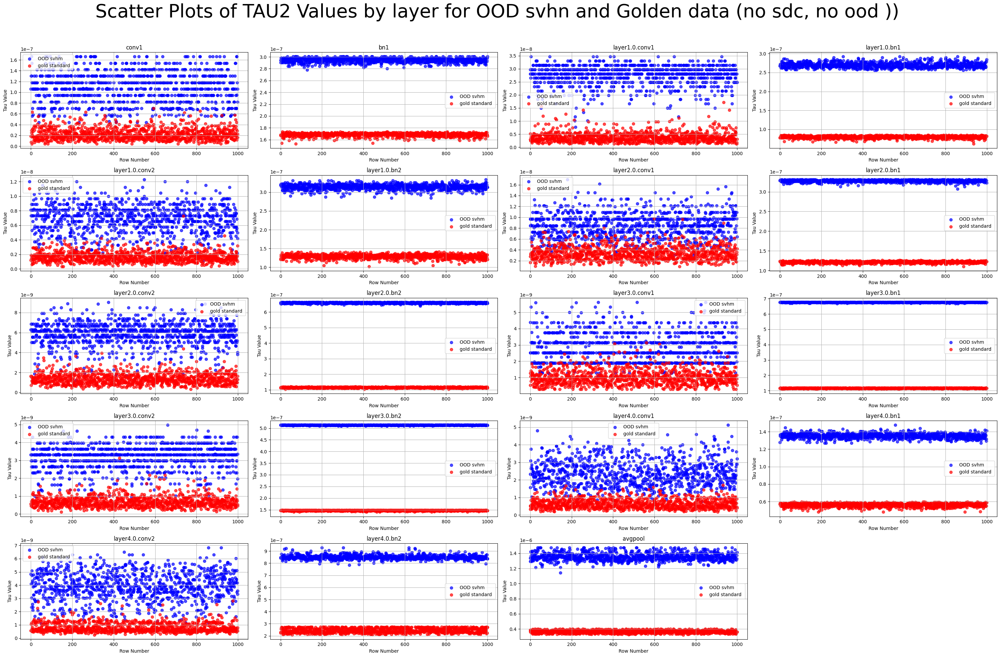

In [69]:
import matplotlib.pyplot as plt
import math

# Get unique layer names
layer_names = list(TAU1adv[0].keys())
num_layers = len(layer_names)

# Determine grid layout (e.g., 4x4 for 16 layers, adjust as necessary)
cols = 4
rows = math.ceil(num_layers / cols)

# Create subplots
fig, axes = plt.subplots(rows, cols, figsize=(30, 20))
fig.suptitle('Scatter Plots of TAU2 Values by layer for OOD svhn and Golden data (no sdc, no ood )) ', fontsize=40)

# Plot each layer in its own subplot
for idx, layer_name in enumerate(layer_names):
    # Calculate row and column index for subplot
    row_idx = idx // cols
    col_idx = idx % cols
    
    # data1 = [ TAU1adv[key][layer_name] for key in TAU1adv ]
    data2 = [ TAU2nosdc[key][layer_name] for key in TAU2nosdc ]
    # data3 = [ TAU1advPGD[key][layer_name] for key in TAU1advPGD ]
    data4 = [ TAU2oodsvhn[key][layer_name] for key in TAU2oodsvhn ]
    row_indices = list(range(1000))
    
    # Scatter plot for this layer
    ax = axes[row_idx, col_idx]
    ax.scatter(row_indices, data4[:1000], color='blue', label='OOD svhm', alpha=0.7)
    ax.scatter(row_indices, data2[:1000], color='red', label='gold standard ', alpha=0.7)
    # ax.scatter(row_indices, data3[:1000], color='green', label='advPGd', alpha=0.7)
    # ax.scatter(row_indices, data4[:1000], color='black', label='oodsvhn', alpha=0.7)
    ax.set_title(layer_name)
    ax.set_xlabel('Row Number')
    ax.set_ylabel('Tau Value')
    ax.legend()
    ax.grid(True)

# Hide any empty subplots
for idx in range(num_layers, rows * cols):
    fig.delaxes(axes.flatten()[idx])

plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout to make room for the main title
plt.show()


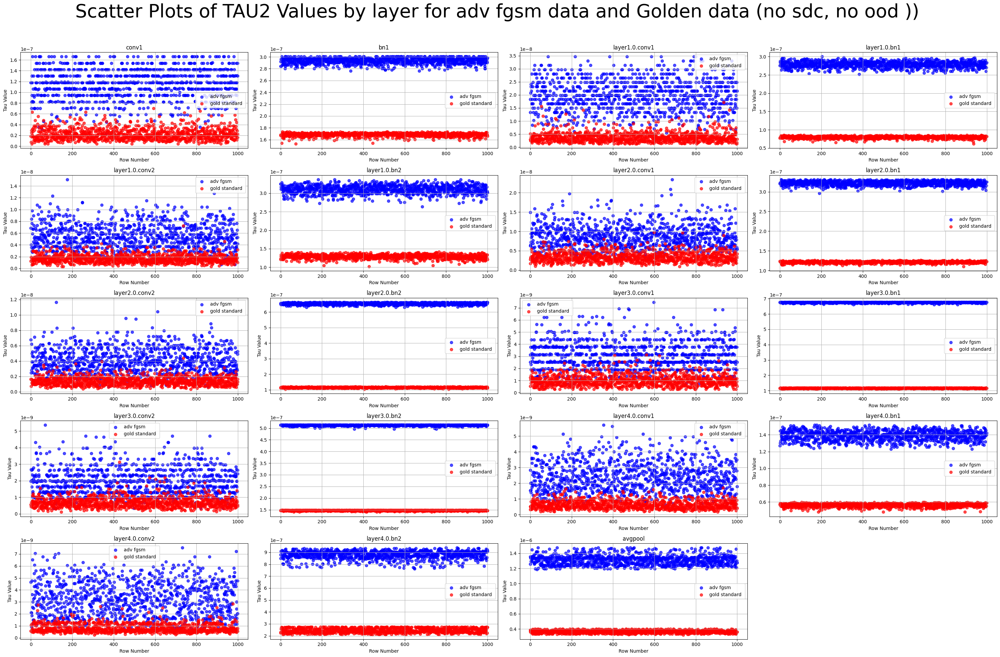

In [70]:
import matplotlib.pyplot as plt
import math

# Get unique layer names
layer_names = list(TAU1adv[0].keys())
num_layers = len(layer_names)

# Determine grid layout (e.g., 4x4 for 16 layers, adjust as necessary)
cols = 4
rows = math.ceil(num_layers / cols)

# Create subplots
fig, axes = plt.subplots(rows, cols, figsize=(30, 20))
fig.suptitle('Scatter Plots of TAU2 Values by layer for adv fgsm data and Golden data (no sdc, no ood )) ', fontsize=40)

# Plot each layer in its own subplot
for idx, layer_name in enumerate(layer_names):
    # Calculate row and column index for subplot
    row_idx = idx // cols
    col_idx = idx % cols
    
    data1 = [ TAU2adv[key][layer_name] for key in TAU2adv ]
    data2 = [ TAU2nosdc[key][layer_name] for key in TAU2nosdc ]
    # data3 = [ TAU1advPGD[key][layer_name] for key in TAU1advPGD ]
    # data4 = [ TAU1oodsvhn[key][layer_name] for key in TAU1oodsvhn ]
    row_indices = list(range(1000))
    
    # Scatter plot for this layer
    ax = axes[row_idx, col_idx]
    ax.scatter(row_indices, data1[:1000], color='blue', label='adv fgsm', alpha=0.7)
    ax.scatter(row_indices, data2[:1000], color='red', label='gold standard ', alpha=0.7)
    # ax.scatter(row_indices, data3[:1000], color='green', label='advPGd', alpha=0.7)
    # ax.scatter(row_indices, data4[:1000], color='black', label='oodsvhn', alpha=0.7)
    ax.set_title(layer_name)
    ax.set_xlabel('Row Number')
    ax.set_ylabel('Tau Value')
    ax.legend()
    ax.grid(True)

# Hide any empty subplots
for idx in range(num_layers, rows * cols):
    fig.delaxes(axes.flatten()[idx])

plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout to make room for the main title
plt.show()


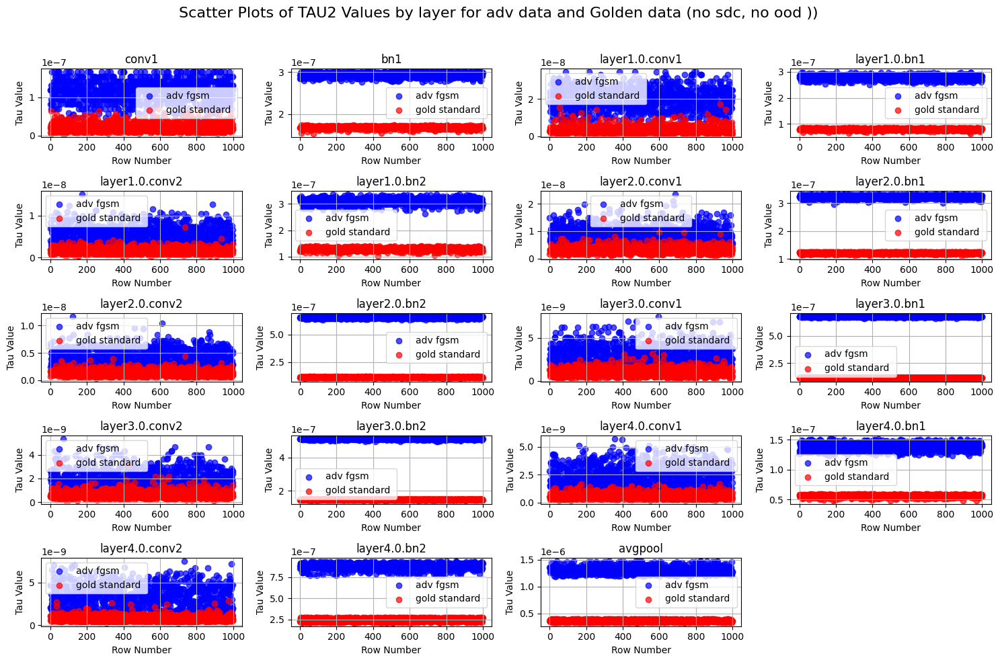

In [71]:
import matplotlib.pyplot as plt
import math

# Get unique layer names
layer_names = list(TAU1adv[0].keys())
num_layers = len(layer_names)

# Determine grid layout (e.g., 4x4 for 16 layers, adjust as necessary)
cols = 4
rows = math.ceil(num_layers / cols)

# Create subplots
fig, axes = plt.subplots(rows, cols, figsize=(15, 10))
fig.suptitle('Scatter Plots of TAU2 Values by layer for adv data and Golden data (no sdc, no ood )) ', fontsize=16)

# Plot each layer in its own subplot
for idx, layer_name in enumerate(layer_names):
    # Calculate row and column index for subplot
    row_idx = idx // cols
    col_idx = idx % cols
    
    data1 = [ TAU2adv[key][layer_name] for key in TAU2adv ]
    data2 = [ TAU2nosdc[key][layer_name] for key in TAU2nosdc ]
    # data3 = [ TAU1advPGD[key][layer_name] for key in TAU1advPGD ]
    # data4 = [ TAU1oodsvhn[key][layer_name] for key in TAU1oodsvhn ]
    row_indices = list(range(1000))
    
    # Scatter plot for this layer
    ax = axes[row_idx, col_idx]
    ax.scatter(row_indices, data1[:1000], color='blue', label='adv fgsm', alpha=0.7)
    ax.scatter(row_indices, data2[:1000], color='red', label='gold standard ', alpha=0.7)
    # ax.scatter(row_indices, data3[:1000], color='green', label='advPGd', alpha=0.7)
    # ax.scatter(row_indices, data4[:1000], color='black', label='oodsvhn', alpha=0.7)
    ax.set_title(layer_name)
    ax.set_xlabel('Row Number')
    ax.set_ylabel('Tau Value')
    ax.legend()
    ax.grid(True)

# Hide any empty subplots
for idx in range(num_layers, rows * cols):
    fig.delaxes(axes.flatten()[idx])

plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout to make room for the main title
plt.show()


Saved plot for layer 'conv1' as 'layer_scatter_plots/scatter_conv1.png'.


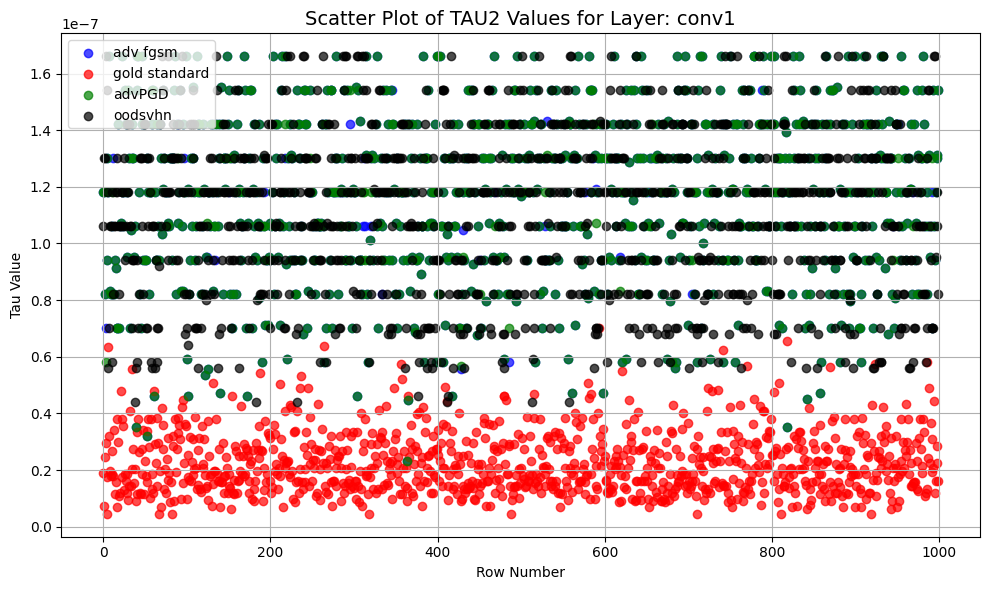

Saved plot for layer 'bn1' as 'layer_scatter_plots/scatter_bn1.png'.


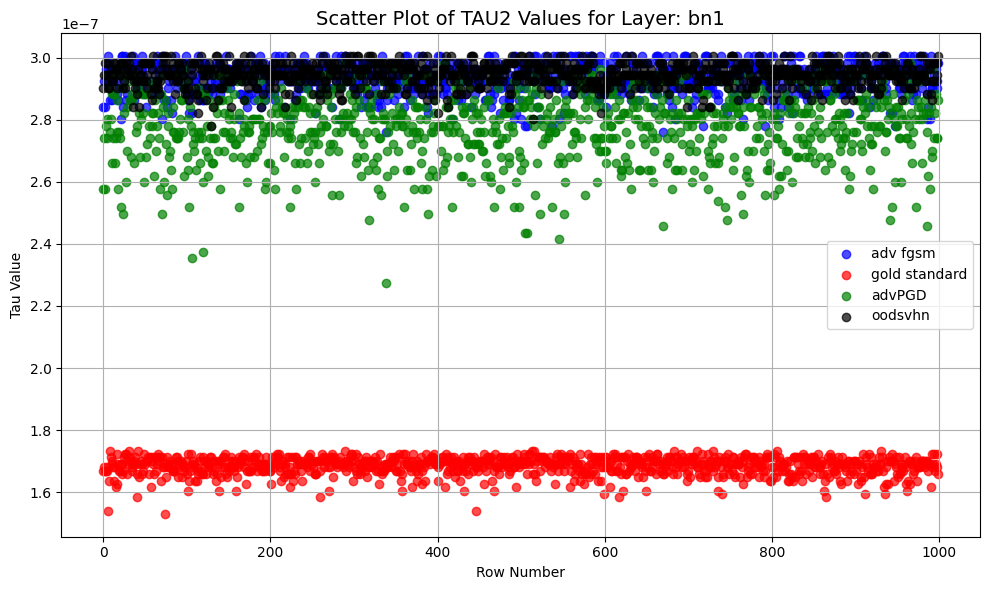

Saved plot for layer 'layer1.0.conv1' as 'layer_scatter_plots/scatter_layer1.0.conv1.png'.


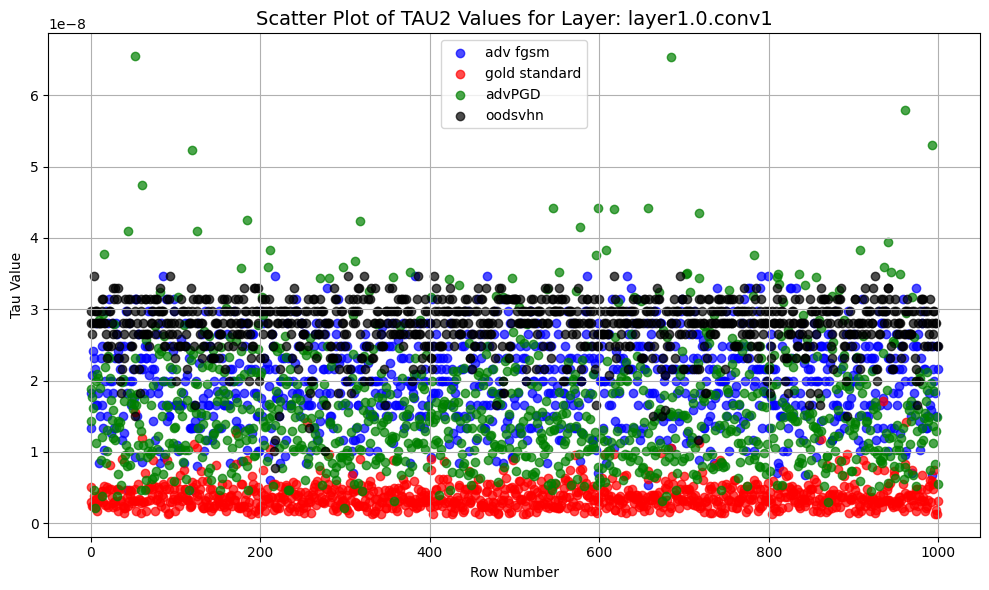

Saved plot for layer 'layer1.0.bn1' as 'layer_scatter_plots/scatter_layer1.0.bn1.png'.


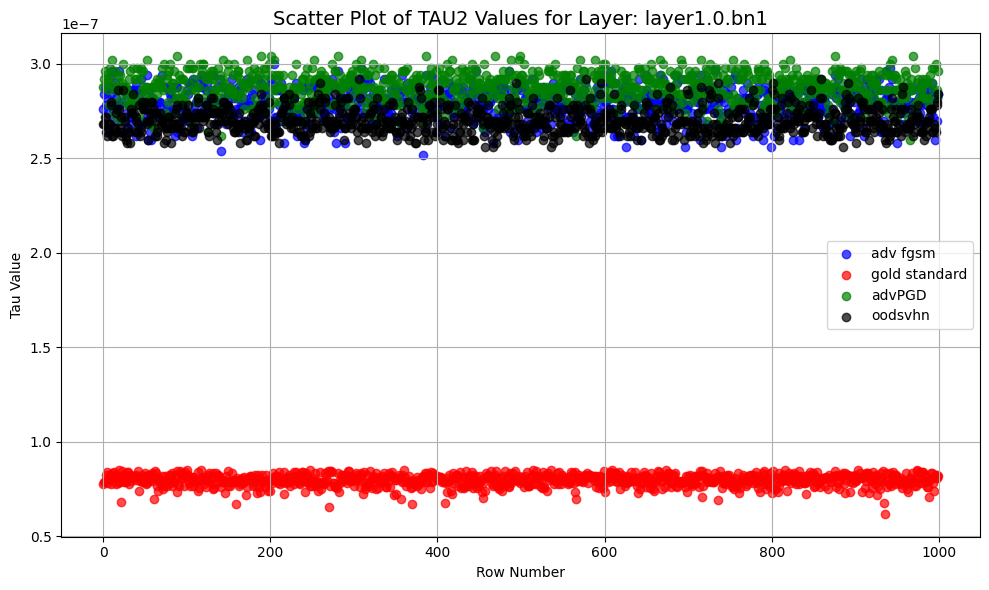

Saved plot for layer 'layer1.0.conv2' as 'layer_scatter_plots/scatter_layer1.0.conv2.png'.


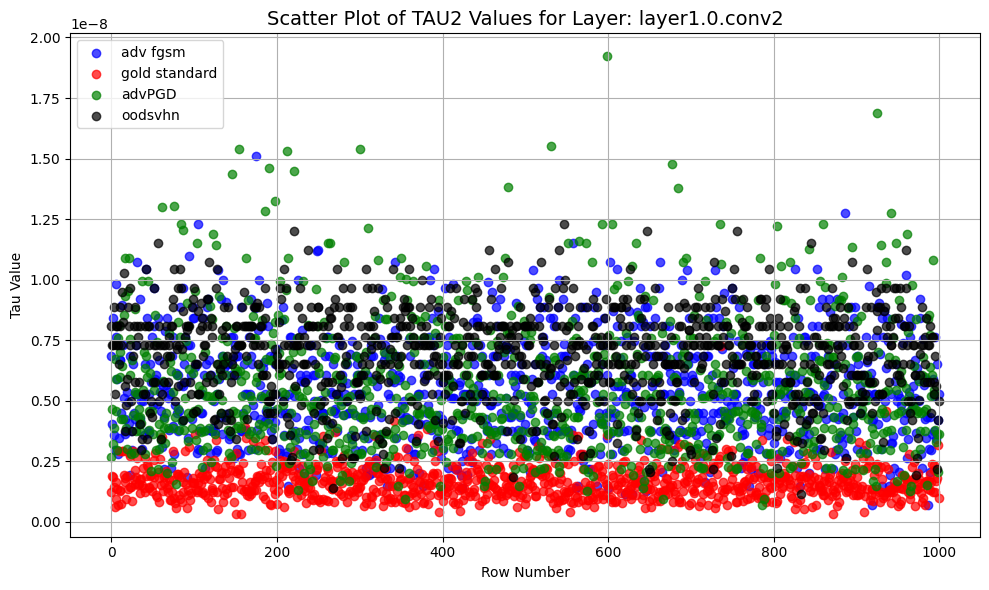

Saved plot for layer 'layer1.0.bn2' as 'layer_scatter_plots/scatter_layer1.0.bn2.png'.


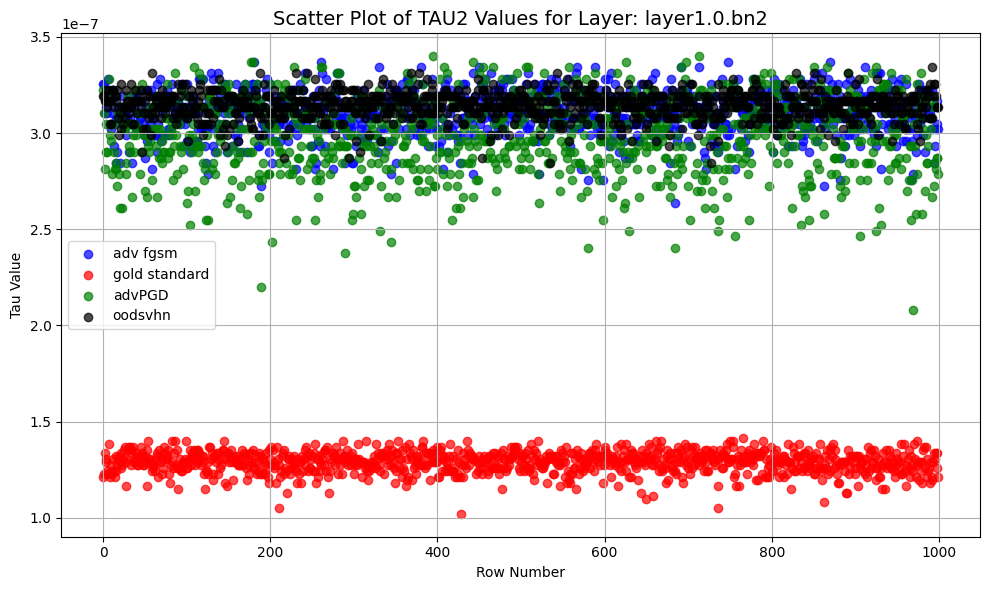

Saved plot for layer 'layer2.0.conv1' as 'layer_scatter_plots/scatter_layer2.0.conv1.png'.


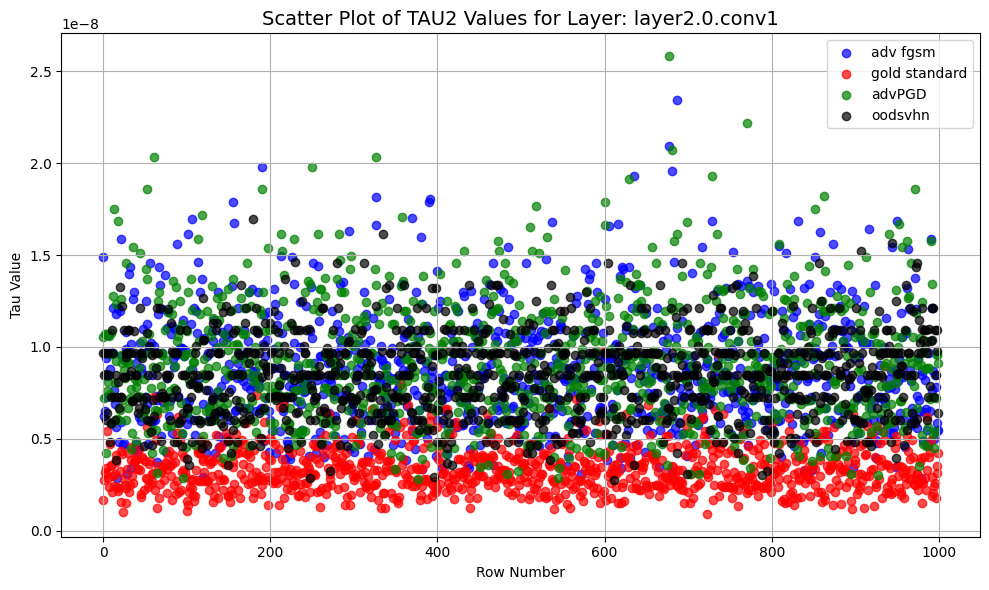

Saved plot for layer 'layer2.0.bn1' as 'layer_scatter_plots/scatter_layer2.0.bn1.png'.


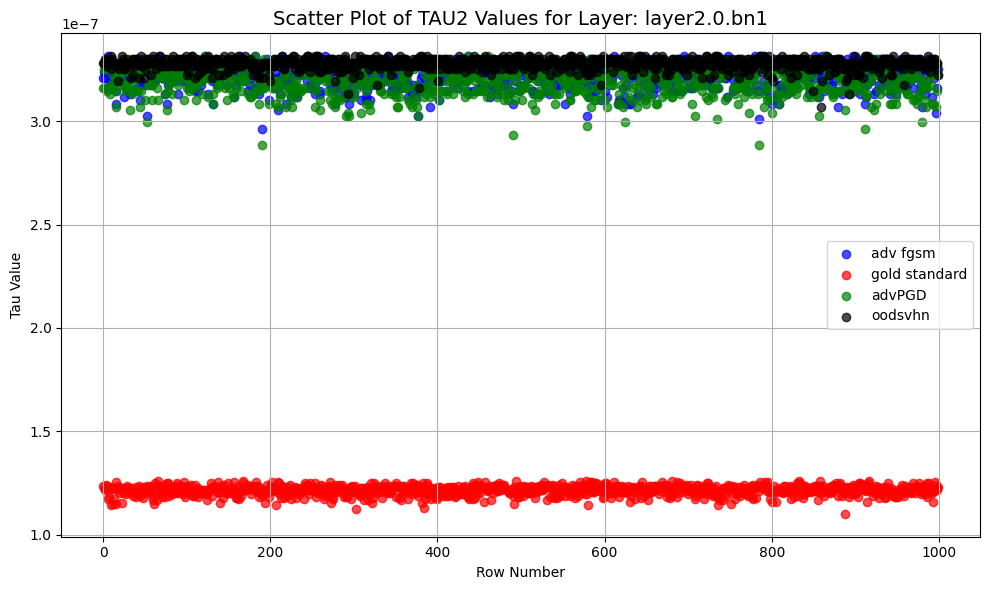

Saved plot for layer 'layer2.0.conv2' as 'layer_scatter_plots/scatter_layer2.0.conv2.png'.


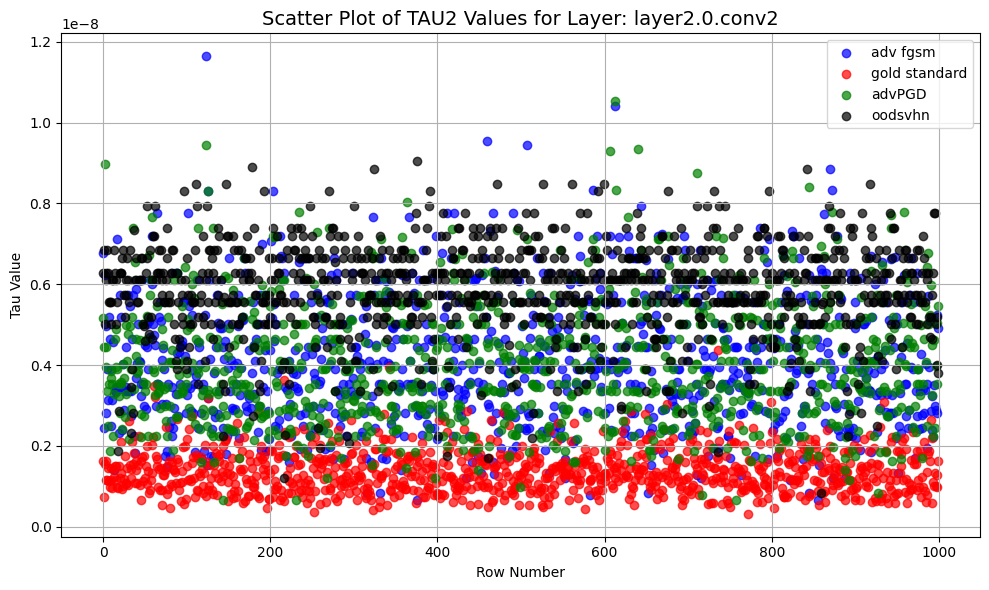

Saved plot for layer 'layer2.0.bn2' as 'layer_scatter_plots/scatter_layer2.0.bn2.png'.


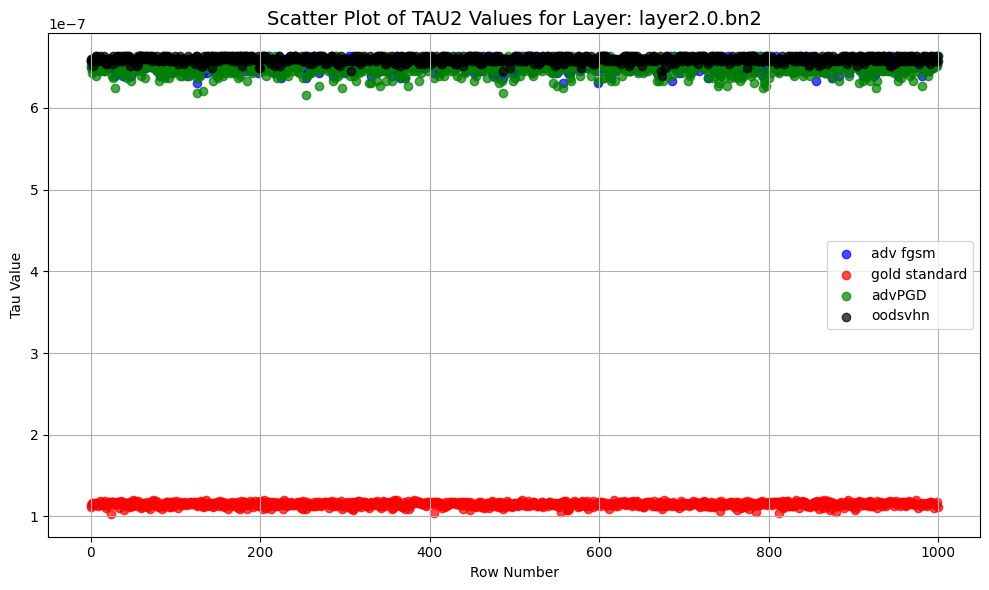

Saved plot for layer 'layer3.0.conv1' as 'layer_scatter_plots/scatter_layer3.0.conv1.png'.


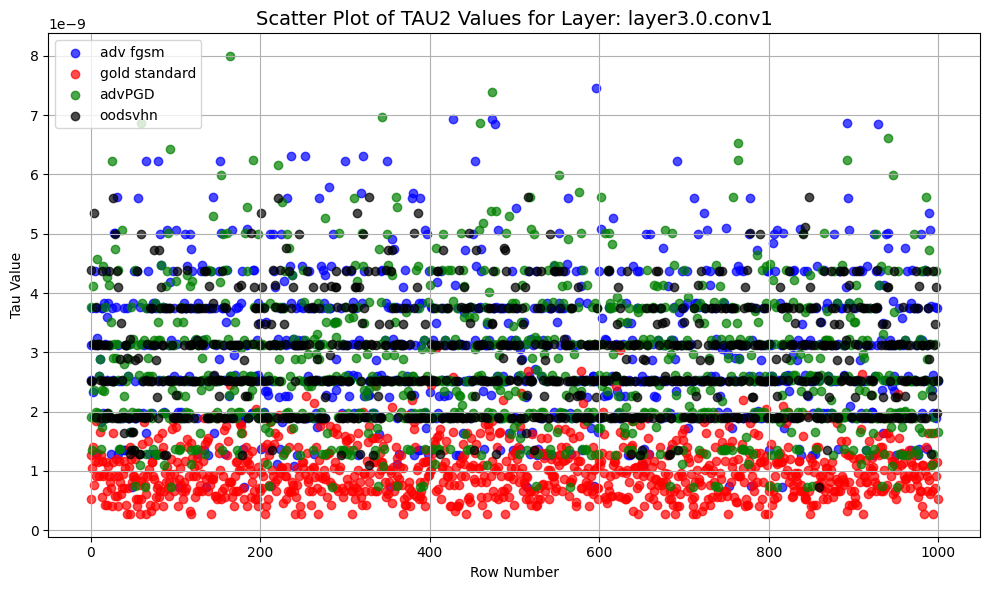

Saved plot for layer 'layer3.0.bn1' as 'layer_scatter_plots/scatter_layer3.0.bn1.png'.


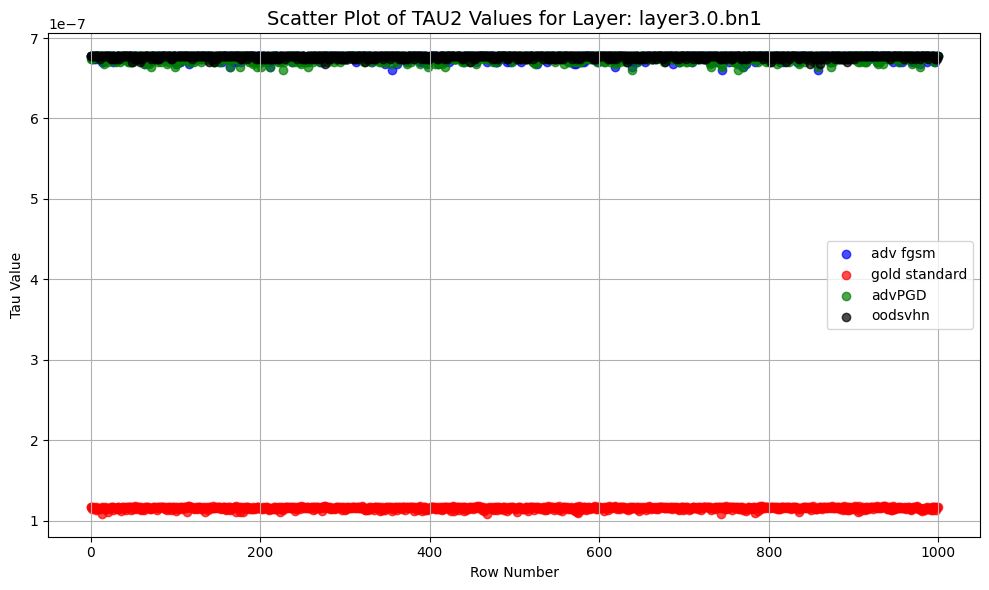

Saved plot for layer 'layer3.0.conv2' as 'layer_scatter_plots/scatter_layer3.0.conv2.png'.


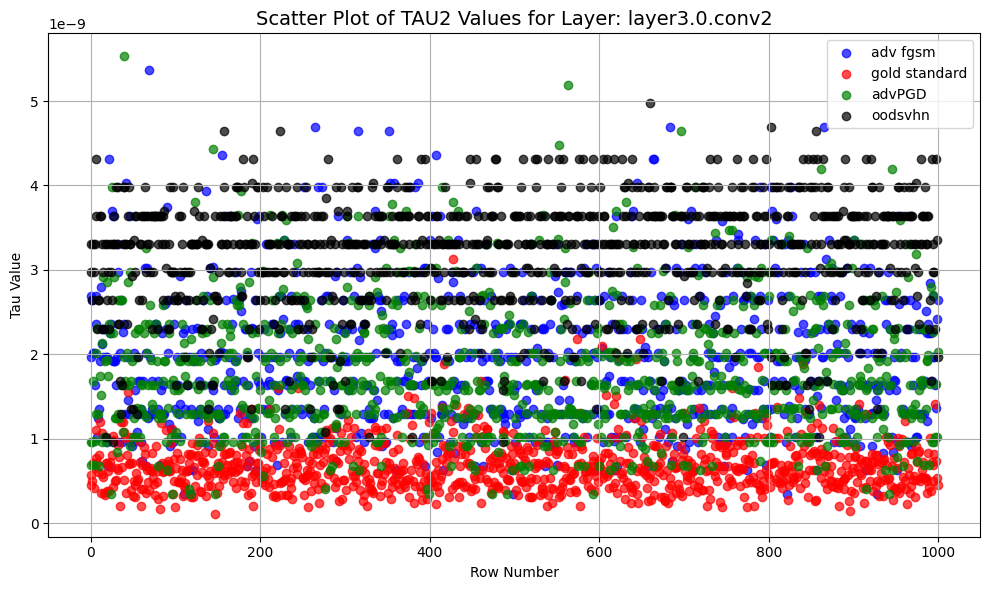

Saved plot for layer 'layer3.0.bn2' as 'layer_scatter_plots/scatter_layer3.0.bn2.png'.


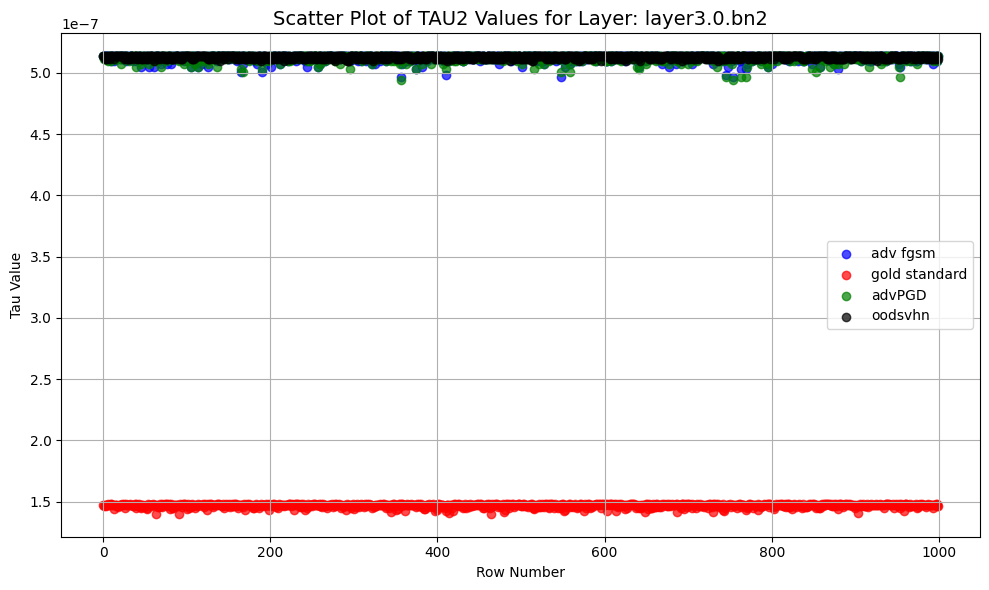

Saved plot for layer 'layer4.0.conv1' as 'layer_scatter_plots/scatter_layer4.0.conv1.png'.


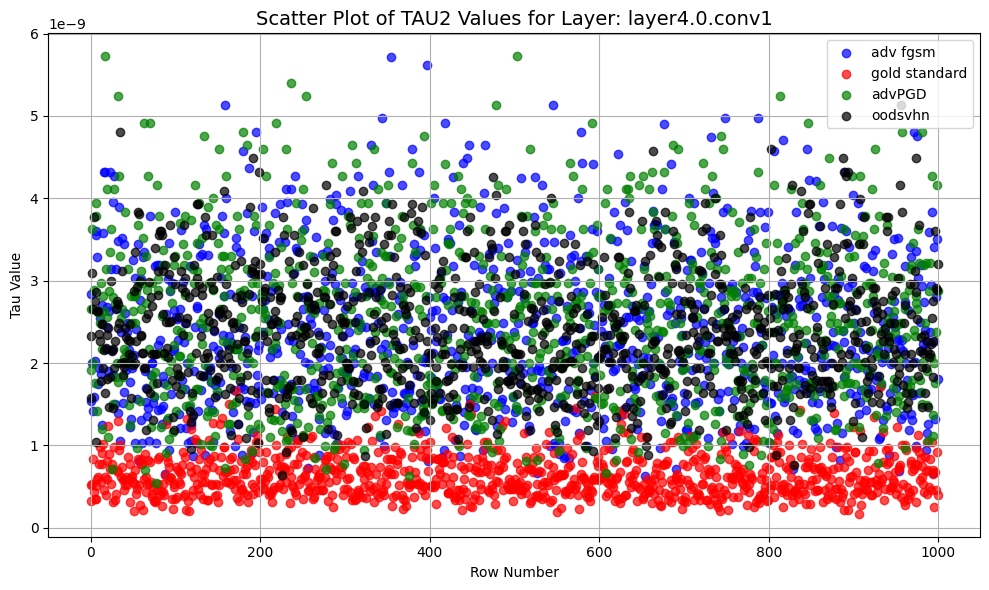

Saved plot for layer 'layer4.0.bn1' as 'layer_scatter_plots/scatter_layer4.0.bn1.png'.


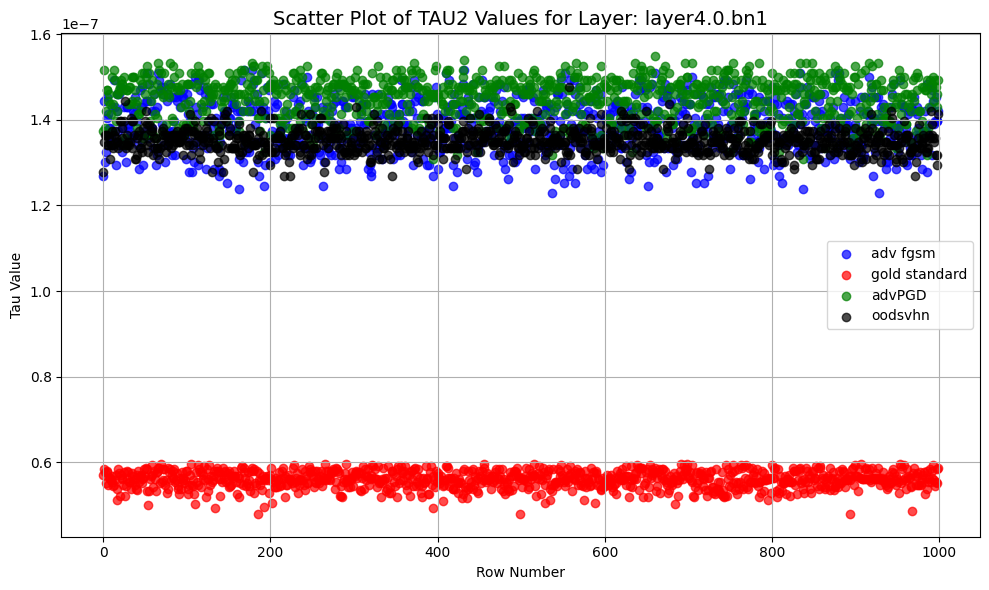

Saved plot for layer 'layer4.0.conv2' as 'layer_scatter_plots/scatter_layer4.0.conv2.png'.


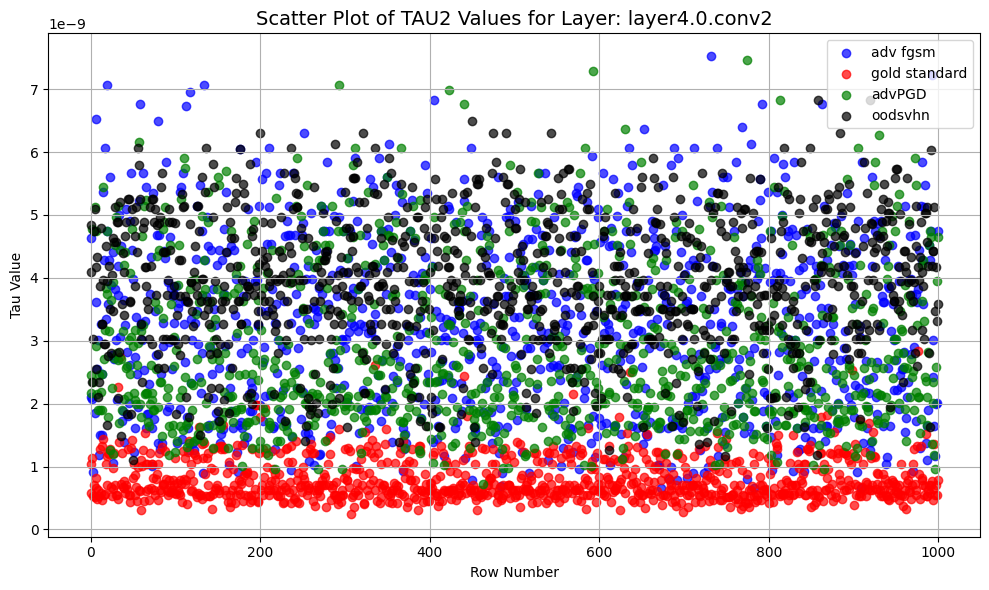

Saved plot for layer 'layer4.0.bn2' as 'layer_scatter_plots/scatter_layer4.0.bn2.png'.


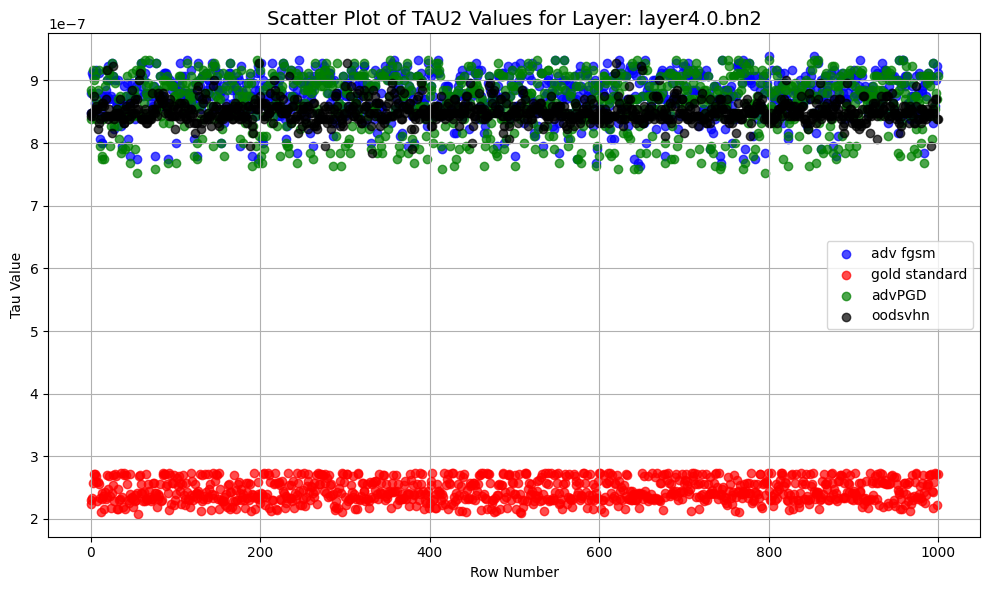

Saved plot for layer 'avgpool' as 'layer_scatter_plots/scatter_avgpool.png'.


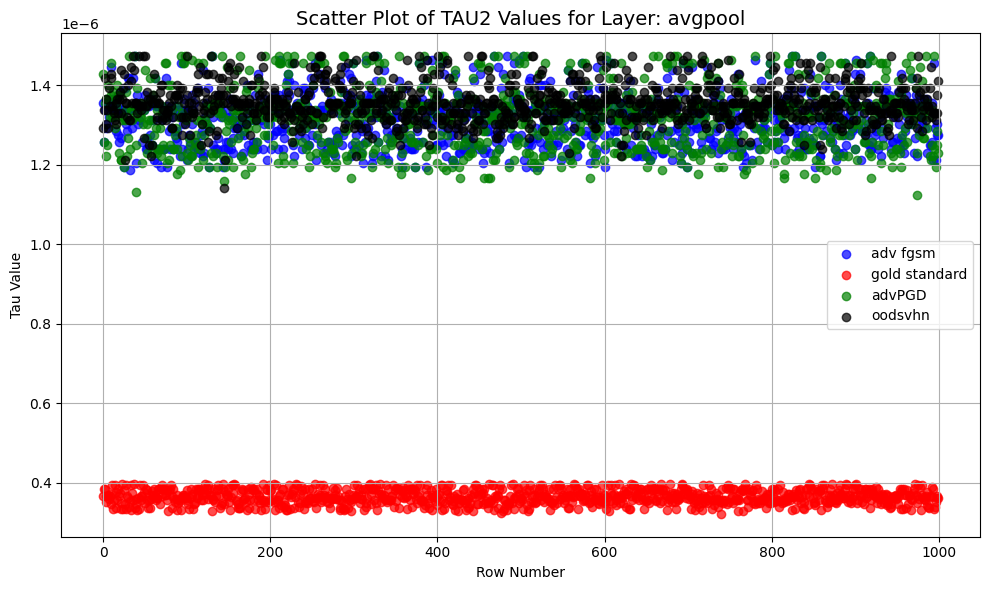

In [72]:
import matplotlib.pyplot as plt
import math
import os

# Ensure that the required data structures (TAU1adv, TAU1nosdc, etc.) are defined
# For example:
# TAU1adv = [{layer1: value1, layer2: value2, ...}, ...]
# Similarly define TAU1nosdc, TAU1advPGD, TAU1oodsvhn

# Get unique layer names
layer_names = list(TAU1adv[0].keys())
num_layers = len(layer_names)

# Directory to save individual plots (optional)
output_dir = 'layer_scatter_plots'
os.makedirs(output_dir, exist_ok=True)

# Iterate over each layer and create a separate plot
for idx, layer_name in enumerate(layer_names, 1):
    # Extract data for the current layer
    data1 = [TAU2adv[key][layer_name] for key in TAU2adv]
    data2 = [TAU2nosdc[key][layer_name] for key in TAU2nosdc]
    data3 = [TAU2advPGD[key][layer_name] for key in TAU2advPGD]
    data4 = [TAU2oodsvhn[key][layer_name] for key in TAU2oodsvhn]
    row_indices = list(range(1000))  # Assuming data1 has the same length as others

    # Create a new figure for the current layer
    plt.figure(figsize=(10, 6))
    plt.title(f'Scatter Plot of TAU2 Values for Layer: {layer_name}', fontsize=14)
    plt.xlabel('Row Number')
    plt.ylabel('Tau Value')

    # Plot scatter points for each dataset
    plt.scatter(row_indices, data1[:1000], color='blue', label='adv fgsm', alpha=0.7)
    plt.scatter(row_indices, data2[:1000], color='red', label='gold standard', alpha=0.7)
    plt.scatter(row_indices, data3[:1000], color='green', label='advPGD', alpha=0.7)
    plt.scatter(row_indices, data4[:1000], color='black', label='oodsvhn', alpha=0.7)

    # Add legend and grid
    plt.legend()
    plt.grid(True)

    # Adjust layout for better spacing
    plt.tight_layout()

    # Optionally, save each plot to a file
    plot_filename = os.path.join(output_dir, f'scatter_{layer_name}.png')
    plt.savefig(plot_filename)
    print(f"Saved plot for layer '{layer_name}' as '{plot_filename}'.")

    # Display the plot (optional)
    plt.show()

    # Close the figure to free up memory
    plt.close()


PLots gold standard vs OOD


/tmp/ipykernel_419039/1659747357.py:45: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


Saved combined plot as 'combined_plot/combined_scatter_plot.png'.


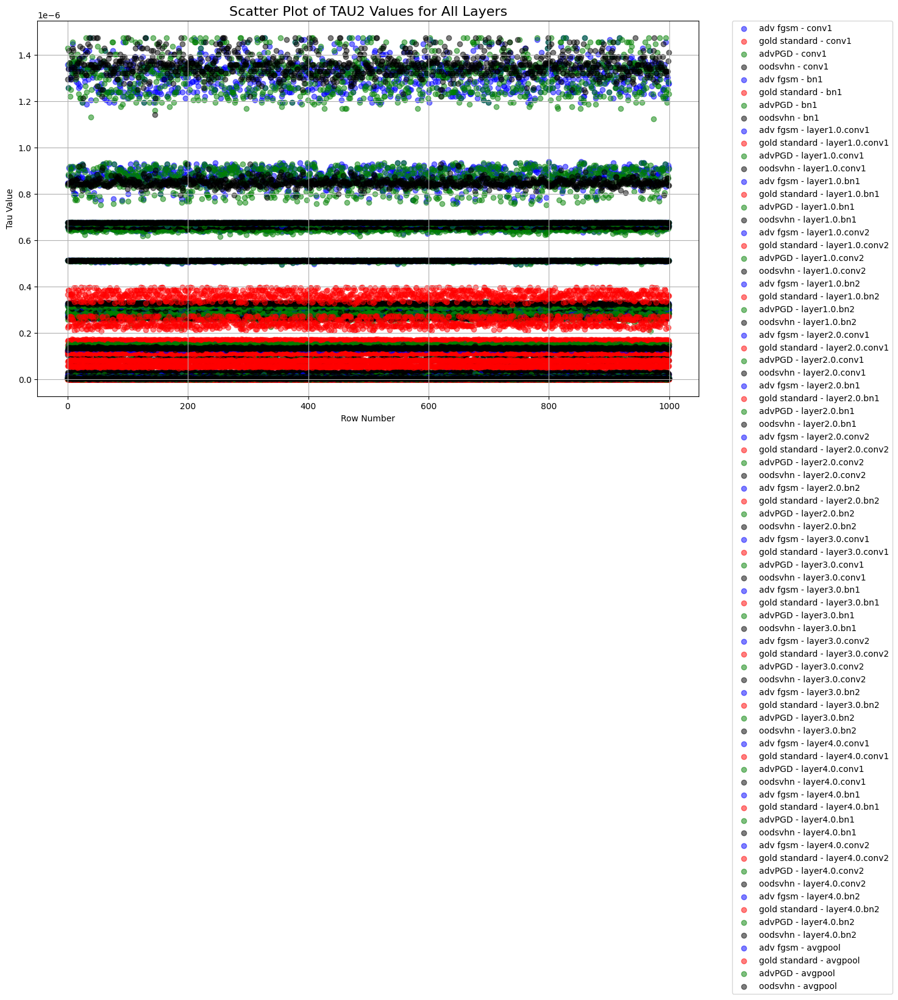

In [77]:
import matplotlib.pyplot as plt
import os

# Ensure that the required data structures (TAU1adv, TAU1nosdc, etc.) are defined
# For example:
# TAU1adv = [{layer1: value1, layer2: value2, ...}, ...]
# Similarly define TAU1nosdc, TAU1advPGD, TAU1oodsvhn

# Get unique layer names
layer_names = list(TAU2adv[0].keys())
num_layers = len(layer_names)

# Directory to save the combined plot (optional)
output_dir = 'combined_plot'
os.makedirs(output_dir, exist_ok=True)

# Create a single figure for all layers
plt.figure(figsize=(14, 8))
plt.title('Scatter Plot of TAU2 Values for All Layers', fontsize=16)
plt.xlabel('Row Number')
plt.ylabel('Tau Value')

# Plot scatter points for each layer and dataset
row_indices = list(range(1000))  # Assuming each dataset has at least 1000 points
colors = ['blue', 'red', 'green', 'black']  # Colors for different data categories
labels = ['adv fgsm', 'gold standard', 'advPGD', 'oodsvhn']  # Labels for each dataset

for i, layer_name in enumerate(layer_names):
    data1 = [TAU2adv[key][layer_name] for key in TAU2adv]
    data2 = [TAU2nosdc[key][layer_name] for key in TAU2nosdc]
    data3 = [TAU2advPGD[key][layer_name] for key in TAU2advPGD]
    data4 = [TAU2oodsvhn[key][layer_name] for key in TAU2oodsvhn]

    # Plot each dataset for the current layer
    plt.scatter(row_indices, data1[:1000], color=colors[0], label=f'{labels[0]} - {layer_name}', alpha=0.5)
    plt.scatter(row_indices, data2[:1000], color=colors[1], label=f'{labels[1]} - {layer_name}', alpha=0.5)
    plt.scatter(row_indices, data3[:1000], color=colors[2], label=f'{labels[2]} - {layer_name}', alpha=0.5)
    plt.scatter(row_indices, data4[:1000], color=colors[3], label=f'{labels[3]} - {layer_name}', alpha=0.5)

# Add legend and grid
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
plt.grid(True)

# Adjust layout to accommodate legend and labels
plt.tight_layout()

# Save the combined plot to a file
plot_filename = os.path.join(output_dir, 'combined_scatter_plot.png')
plt.savefig(plot_filename)
print(f"Saved combined plot as '{plot_filename}'.")

# Display the combined plot
plt.show()

# Close the figure to free up memory
plt.close()


Saved plot for layer 'avgpool' as 'layer_scatter_plots/scatter_avgpool.png'.


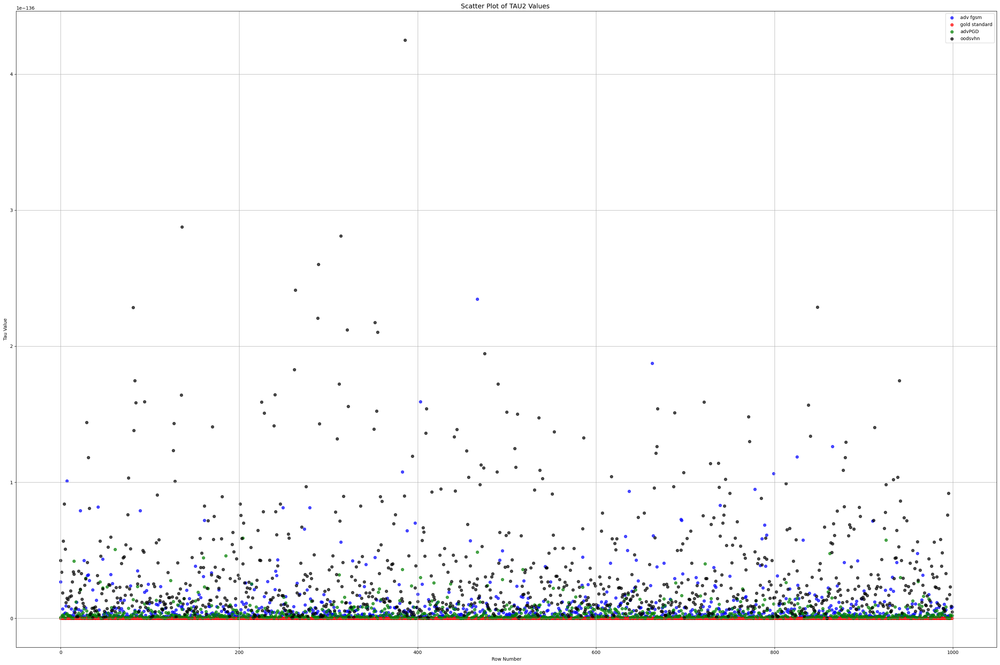

In [74]:
tau2advfgsm =[]
tau2advpgd = []
tau2oodsvhn = []
tau2nosdc = []

for idx in TAU2adv:
    # Extract data for the current layer
    advfgsm = 1
    advpgd = 1
    oodsvhn = 1
    nosdc = 1
    
    for layer_name in layer_names:
        advfgsm = advfgsm * TAU2adv[idx][layer_name]
        advpgd = advpgd * TAU2advPGD[idx][layer_name]
        oodsvhn = oodsvhn * TAU2oodsvhn[idx][layer_name]
        nosdc = nosdc * TAU2nosdc[idx][layer_name]

    tau2advfgsm += [advfgsm]
    tau2advpgd += [advpgd]
    tau2oodsvhn += [oodsvhn]
    tau2nosdc += [nosdc]


    # data2 = [TAU2nosdc[key][layer_name] for key in TAU2nosdc]
    # data3 = [TAU2advPGD[key][layer_name] for key in TAU2advPGD]
    # data4 = [TAU2oodsvhn[key][layer_name] for key in TAU2oodsvhn]
row_indices = list(range(1000))  # Assuming data1 has the same length as others

# Create a new figure for the current layer
plt.figure(figsize=(30, 20))
plt.title(f'Scatter Plot of TAU2 Values ', fontsize=14)
plt.xlabel('Row Number')
plt.ylabel('Tau Value')

# Plot scatter points for each dataset
plt.scatter(row_indices, tau2advfgsm[:1000], color='blue', label='adv fgsm', alpha=0.7)
plt.scatter(row_indices, tau2nosdc[:1000], color='red', label='gold standard', alpha=0.7)
plt.scatter(row_indices, tau2advpgd[:1000], color='green', label='advPGD', alpha=0.7)
plt.scatter(row_indices, tau2oodsvhn[:1000], color='black', label='oodsvhn', alpha=0.7)

# Add legend and grid
plt.legend()
plt.grid(True)

# Adjust layout for better spacing
plt.tight_layout()

# Optionally, save each plot to a file
plot_filename = os.path.join(output_dir, f'scatter_{layer_name}.png')
plt.savefig(plot_filename)
print(f"Saved plot for layer '{layer_name}' as '{plot_filename}'.")

# Display the plot (optional)
plt.show()

# Close the figure to free up memory
plt.close()

Saved plot for layer 'avgpool' as 'layer_scatter_plots/scatter_avgpool.png'.


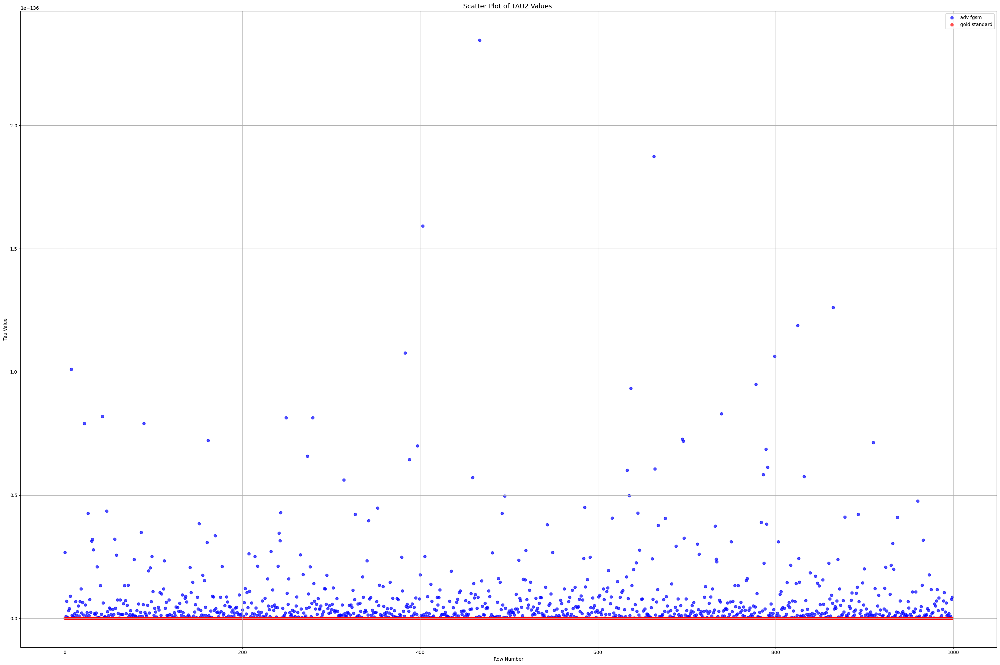

In [75]:
# Create a new figure for the current layer
plt.figure(figsize=(30, 20))
plt.title(f'Scatter Plot of TAU2 Values ', fontsize=14)
plt.xlabel('Row Number')
plt.ylabel('Tau Value')

# Plot scatter points for each dataset
plt.scatter(row_indices, tau2advfgsm[:1000], color='blue', label='adv fgsm', alpha=0.7)
plt.scatter(row_indices, tau2nosdc[:1000], color='red', label='gold standard', alpha=0.7)
# plt.scatter(row_indices, tau2advpgd[:1000], color='green', label='advPGD', alpha=0.7)
# plt.scatter(row_indices, tau2oodsvhn[:1000], color='black', label='oodsvhn', alpha=0.7)

# Add legend and grid
plt.legend()
plt.grid(True)

# Adjust layout for better spacing
plt.tight_layout()

# Optionally, save each plot to a file
plot_filename = os.path.join(output_dir, f'scatter_{layer_name}.png')
plt.savefig(plot_filename)
print(f"Saved plot for layer '{layer_name}' as '{plot_filename}'.")

# Display the plot (optional)
plt.show()

# Close the figure to free up memory
plt.close()

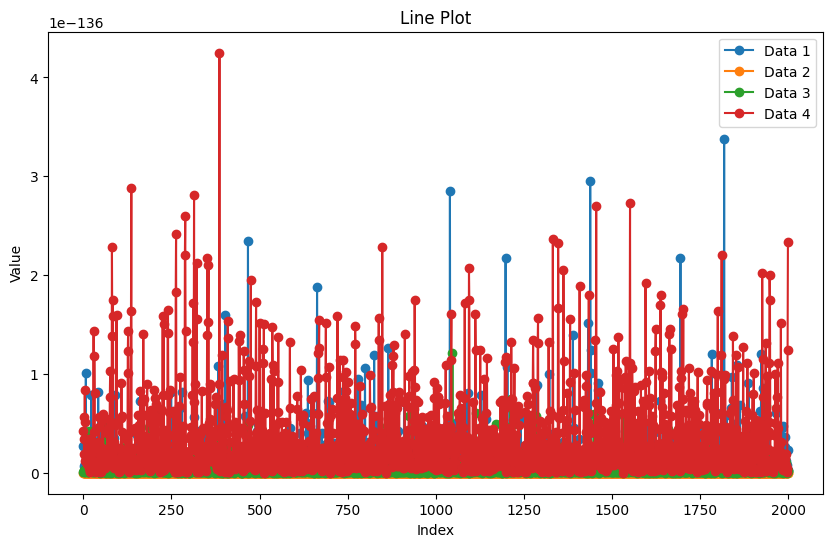

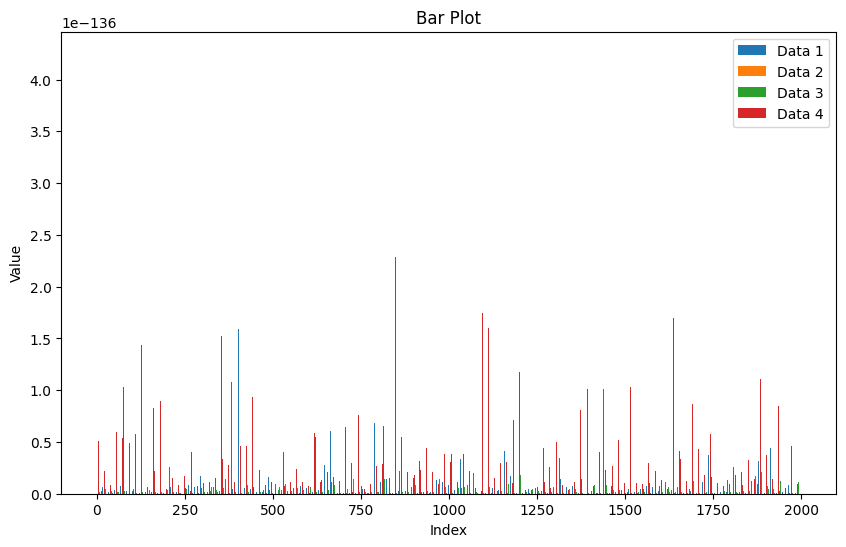

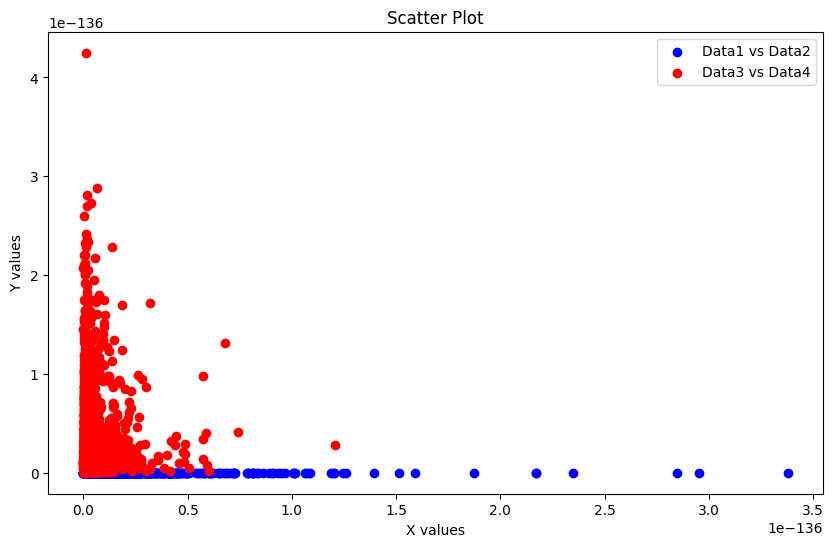

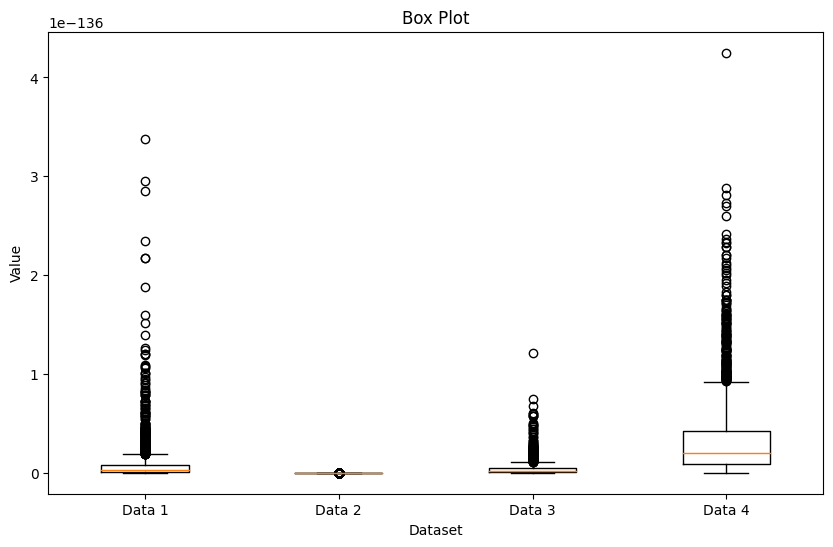

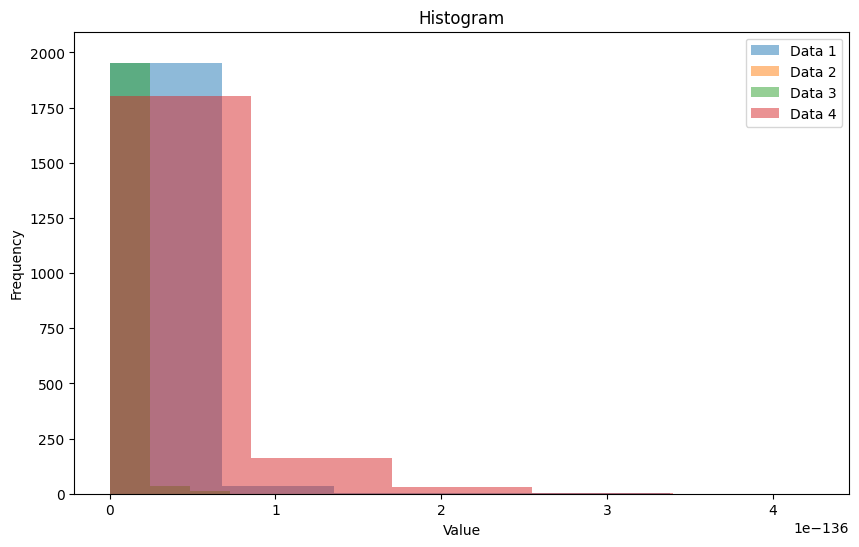

In [76]:
import matplotlib.pyplot as plt

# Example data
data1 = tau2advfgsm
data2 = tau2nosdc
data3 = tau2advpgd
data4 = tau2oodsvhn

# 1. Line Plot
plt.figure(figsize=(10, 6))
plt.plot(data1, label="Data 1", marker='o')
plt.plot(data2, label="Data 2", marker='o')
plt.plot(data3, label="Data 3", marker='o')
plt.plot(data4, label="Data 4", marker='o')
plt.title("Line Plot")
plt.xlabel("Index")
plt.ylabel("Value")
plt.legend()
plt.show()

# 2. Bar Plot
plt.figure(figsize=(10, 6))
x = range(len(data1))
width = 0.2  # Width of each bar
plt.bar([i - width*1.5 for i in x], data1, width=width, label="Data 1")
plt.bar([i - width*0.5 for i in x], data2, width=width, label="Data 2")
plt.bar([i + width*0.5 for i in x], data3, width=width, label="Data 3")
plt.bar([i + width*1.5 for i in x], data4, width=width, label="Data 4")
plt.title("Bar Plot")
plt.xlabel("Index")
plt.ylabel("Value")
plt.legend()
plt.show()

# 3. Scatter Plot
plt.figure(figsize=(10, 6))
plt.scatter(data1, data2, label="Data1 vs Data2", color='b')
plt.scatter(data3, data4, label="Data3 vs Data4", color='r')
plt.title("Scatter Plot")
plt.xlabel("X values")
plt.ylabel("Y values")
plt.legend()
plt.show()

# 4. Box Plot
plt.figure(figsize=(10, 6))
plt.boxplot([data1, data2, data3, data4], labels=["Data 1", "Data 2", "Data 3", "Data 4"])
plt.title("Box Plot")
plt.xlabel("Dataset")
plt.ylabel("Value")
plt.show()

# 5. Histogram Plot
plt.figure(figsize=(10, 6))
plt.hist(data1, bins=5, alpha=0.5, label="Data 1")
plt.hist(data2, bins=5, alpha=0.5, label="Data 2")
plt.hist(data3, bins=5, alpha=0.5, label="Data 3")
plt.hist(data4, bins=5, alpha=0.5, label="Data 4")
plt.title("Histogram")
plt.xlabel("Value")
plt.ylabel("Frequency")
plt.legend()
plt.show()
